In [17]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import rcParams
from adjustText import adjust_text
import scipy, statsmodels
import seaborn as sns
import collections
from statsmodels.stats import multitest
import pickle as pk
from scipy import stats
from scipy.stats import pearsonr, spearmanr
from sklearn.cluster import KMeans
from matplotlib.backends.backend_pdf import PdfPages
import statsmodels.api as sm
import matplotlib

import diffxpy.api as de

plt.rcParams.update(plt.rcParamsDefault)
rc={"axes.labelsize": 16, "xtick.labelsize": 12, "ytick.labelsize": 12,
    "figure.titleweight":"bold", #"font.size":14,
    "figure.figsize":(5.5,4.2), "font.weight":"regular", "legend.fontsize":10,
    'axes.labelpad':8, 'figure.dpi':300}
plt.rcParams.update(**rc)

colmap = {'Adipocytes': '#1f77b4',
         'Basophils': '#aec7e8',
         'Bcells': '#ff7f0e',
         'CD4T':'#ffbb78',
         'CD8T': '#2ca02c',
         'Cytotoxic_T': '#98df8a',
         'EC': '#d62728',
         'Erythroid-like': '#ff9896',
         'ILC2s': '#9467bd',
         'Lymph_EC':'#c5b0d5',
         'MSC':'#8c564b',
         'Macrophages':'#c49c94',
         'NK':'#e377c2',
         'NMSC':'#f7b6d2',
         'Neutrophils':'#7f7f7f',
         'Pdgfra_APC':'#c7c7c7',
         'Pericytes':'#bcbd22',
         'Platelets':'#dbdb8d',
         'Treg':'#17becf',
         'VSM':'#9edae5'}


##### run cell ranger to get count
```shell
raw_data=/lab-share/Cardio-Chen-e2/Public/rongbinzheng/scRNA_BAT/mouse/raw_data/sra/
ref_data=/lab-share/Cardio-Chen-e2/Public/rongbinzheng/Genome/mm10/cellranger/mm10/

for gsm in `cut -f1 meta.txt`
do
        echo "===================================${gsm}"
        cellranger count --id=${gsm} --transcriptome=${ref_data} --fastqs=${raw_data}/${gsm} --sample=${gsm} --localcores 12 --r1-length 26
done
```



In [3]:
meta = pd.read_csv('../meta.txt', sep = '\t', header = None, index_col = 0)
gsm_all = meta.index.tolist()


In [4]:
gsm = gsm_all[0]
scbat_obj = sc.read_10x_mtx(path = '../{}/outs/filtered_feature_bc_matrix/'.format(gsm)) ## read 10x
scbat_obj.obs['gsm'] = gsm ## label gsm
scbat_obj.obs['sample_name'] = meta.loc[gsm,1] ## label sample name, such as TN_1

for gsm in gsm_all[1:]:
    print(gsm)
    tmp = sc.read_10x_mtx(path = '../{}/outs/filtered_feature_bc_matrix/'.format(gsm))
    tmp.obs['gsm'] = gsm
    tmp.obs['sample_name'] = meta.loc[gsm,1]
    ## merge to big dataset
    scbat_obj = scbat_obj.concatenate(tmp)
## label cond
scbat_obj.obs['cond'] = scbat_obj.obs['sample_name'].str.split('_').apply(lambda x: x[0])

    

GSM4875675
GSM4875676
GSM4875677
GSM4875678
GSM4875679
GSM4875680
GSM4875681
GSM4875682
GSM4875683
GSM4875684
GSM4875685
GSM4875686
GSM4875687
GSM4875688
GSM4875689


In [2]:
# scbat_obj.write('scBAT_scanpy_allcell_readcount.h5ad')
scbat_obj = sc.read_h5ad('scBAT_scanpy_allcell_readcount.h5ad')


In [4]:
### analysis
## unique gene name
scbat_obj.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
## basic filter
sc.pp.filter_cells(scbat_obj, min_genes=400)
sc.pp.filter_genes(scbat_obj, min_cells=10)



/lab-share/Cardio-Chen-e2/Public/rongbinzheng/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


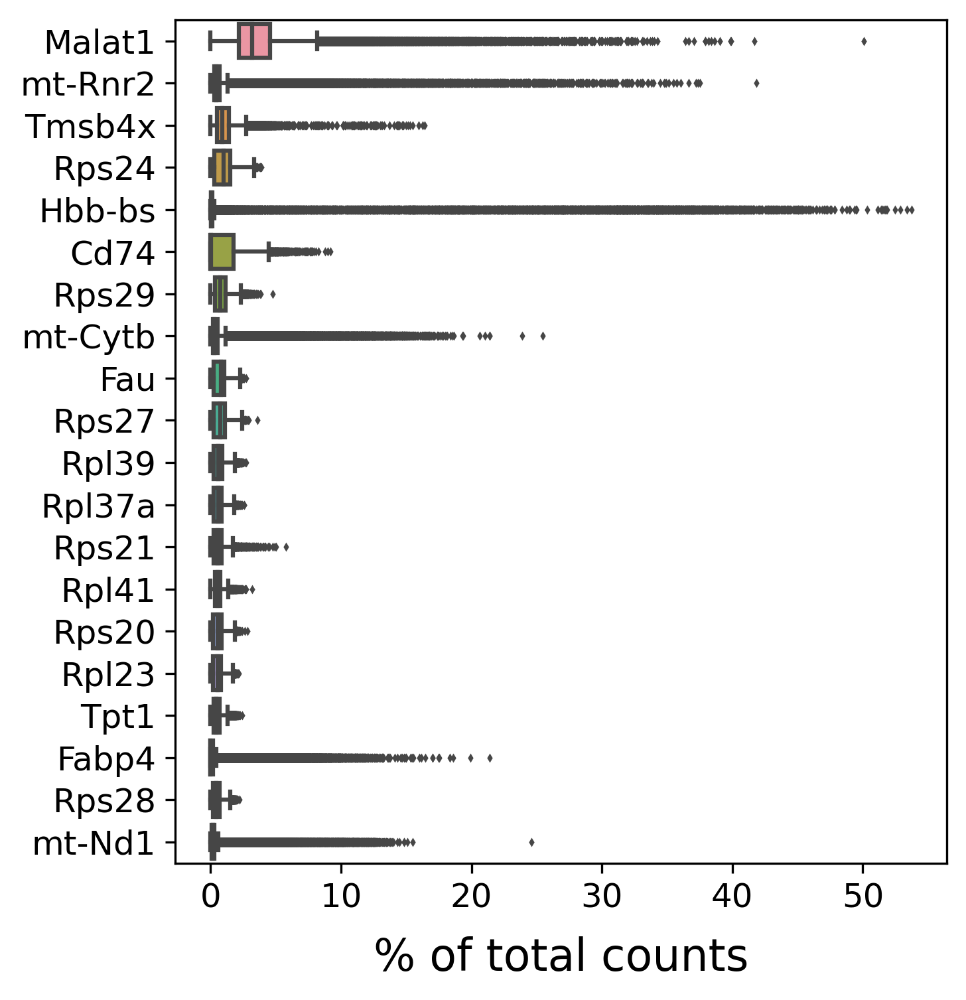

In [5]:
### highest expressing genes
sc.pl.highest_expr_genes(scbat_obj, n_top=20, )


In [6]:
## calculate additional stat for cell and gene
scbat_obj.var['mt'] = scbat_obj.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(scbat_obj, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)



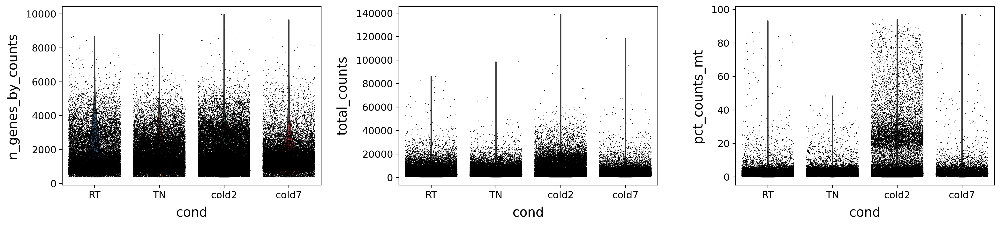

In [7]:
## plot QC
sc.pl.violin(scbat_obj, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='cond')


In [8]:
# ## additional filter
scbat_obj = scbat_obj[(scbat_obj.obs.n_genes_by_counts < 7500) &
                      (scbat_obj.obs.total_counts < 5e+04) & ## too many genes per cell may due to doublelet
                      (scbat_obj.obs.total_counts > 800) &
                      (scbat_obj.obs.n_genes_by_counts > 400), ## too few genes or cell also not good
                      :] 


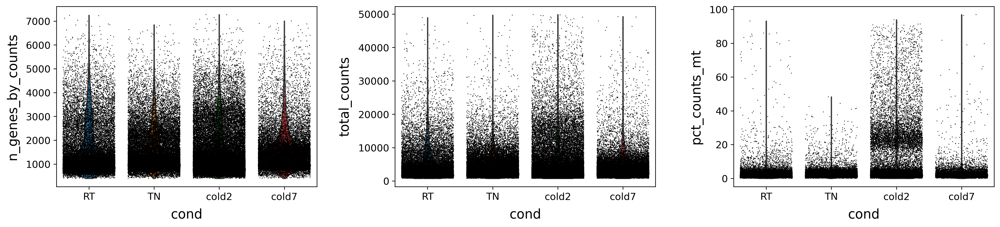

In [9]:
## plot QC agian
sc.pl.violin(scbat_obj, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='cond')

            

In [66]:
## normalization
#### sum each sample total count to certain number 
sc.pp.normalize_total(scbat_obj, target_sum=1e4)
### take log
sc.pp.log1p(scbat_obj)
## get highly variable genes
sc.pp.highly_variable_genes(scbat_obj, min_mean=0.0125, max_mean=3, min_disp=0.5)
## backup raw
scbat_obj.raw = scbat_obj


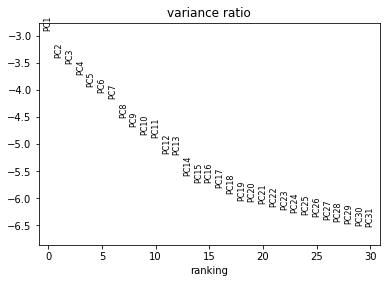

In [76]:
## extract varibale gene expression
scbat_obj = scbat_obj[:, scbat_obj.var.highly_variable]
## Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(scbat_obj, ['total_counts', 'pct_counts_mt'])
# scale for variable genes
sc.pp.scale(scbat_obj, max_value=10)
## PCA
sc.tl.pca(scbat_obj, svd_solver='arpack')

sc.pl.pca_variance_ratio(scbat_obj, log=True)



In [86]:

# ## find neighbors
sc.pp.neighbors(scbat_obj, n_neighbors=10, n_pcs=40)
# ## UMAP
sc.tl.umap(scbat_obj)
# ## clustering
sc.tl.leiden(scbat_obj)


In [106]:
## In some ocassions, you might still observe disconnected clusters and similar connectivity violations. 
## They can usually be remedied by running:
sc.tl.paga(scbat_obj)
sc.pl.paga(scbat_obj, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(scbat_obj, init_pos='paga')


In [117]:
## save adata to hd5
# scbat_obj.write('./scBAT_scanpy_allcell.h5ad')



In [6]:
scbat_obj = sc.read_h5ad('scBAT_scanpy_allcell.h5ad')


Trying to set attribute `.uns` of view, copying.


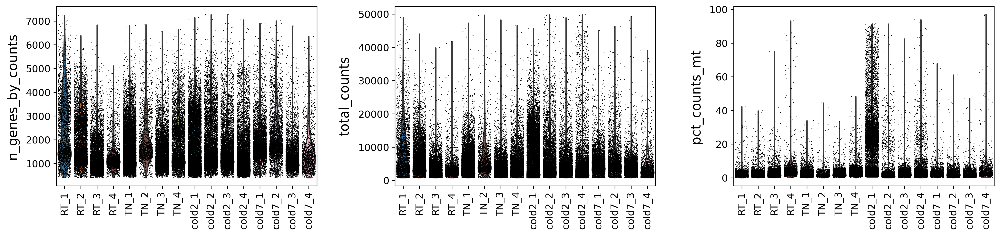

In [10]:
## again, check each sample QC to see if there are samples needed to be excluded
sc.pl.violin(scbat_obj, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='sample_name', rotation = 90)

### cold2_1 is a bad sample due to too high mt reads and total counts, may caused by ambient RNA


## remove cold2_1 and re-do analysis


In [7]:
## extract raw data
scbat_obj = scbat_obj.raw.to_adata()
## remove cold2_1 samples
scbat_obj = scbat_obj[scbat_obj.obs['sample_name'] != 'cold2_1']
scbat_obj.raw = scbat_obj


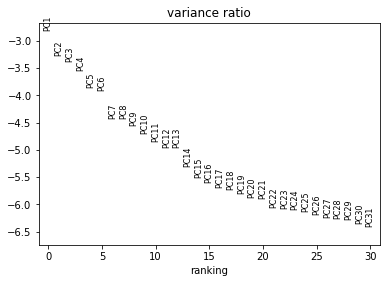

In [8]:
## find the variable gene
sc.pp.highly_variable_genes(scbat_obj, 
                            min_mean=0.0125, 
                            max_mean=3, 
                            min_disp=0.5)
## extract varibale gene expression
scbat_obj = scbat_obj[:, scbat_obj.var.highly_variable]

## Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(scbat_obj, ['total_counts', 'pct_counts_mt'], n_jobs = 2)
# scale for variable genes
sc.pp.scale(scbat_obj, max_value=10)
## PCA
sc.tl.pca(scbat_obj, svd_solver='arpack', n_comps = 50)
sc.pl.pca_variance_ratio(scbat_obj, log=True)



In [9]:
# ## find neighbors
sc.pp.neighbors(scbat_obj,
                n_neighbors=10, 
                n_pcs=40
               )
sc.tl.umap(scbat_obj)
# ## clustering
sc.tl.leiden(scbat_obj)



In [11]:
# ## In some ocassions, you might still observe disconnected clusters and similar connectivity violations. 
# ## They can usually be remedied by running:
scbat_obj_paga = sc.tl.paga(scbat_obj, copy = True)
sc.pl.paga(scbat_obj_paga, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(scbat_obj_paga, init_pos='paga')



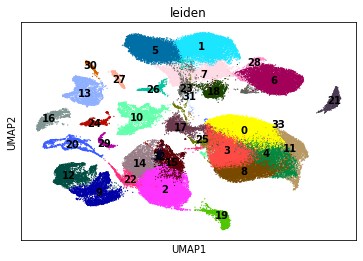

In [74]:
## plot
sc.pl.umap(scbat_obj_paga, color=['leiden'], size = 6, legend_loc = 'on data',
           save = 'scBAT_scanpy_noCold2_1_reprocess_paga_cluster.pdf')


Trying to set attribute `.uns` of view, copying.


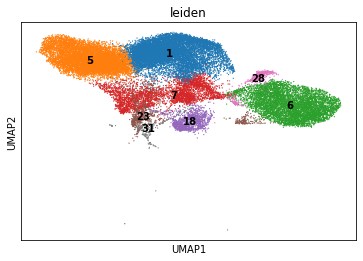

In [4]:
## since T cell and immune cell clustering is a little fuzzy, re-cluster specifically for some immune cells (Cd3+ and Nkg7+)
### record cell-cluster info
cell_cluster = pd.Series(scbat_obj_paga.obs['leiden'])

### extract immune cells
immune_cluster = ['5', '1', '7', '23', '31', '18', '28', '6']
scbat_obj_paga_immune = scbat_obj_paga[scbat_obj_paga.obs['leiden'].isin(immune_cluster)]
sc.pl.umap(scbat_obj_paga_immune, color=['leiden'], size = 6, legend_loc = 'on data')


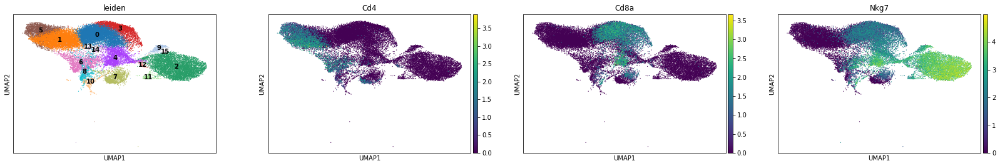

In [5]:
## running clustering in immune cells
sc.tl.leiden(scbat_obj_paga_immune, resolution = 0.5)
sc.pl.umap(scbat_obj_paga_immune, color=['leiden', 'Cd4', 'Cd8a', 'Nkg7'], size = 6,
           legend_loc = 'on data')



In [6]:
### assign new cluster for cells
immune_cell_cluster = pd.Series(scbat_obj_paga_immune.obs['leiden'])
cell_cluster = cell_cluster[~cell_cluster.index.isin(immune_cell_cluster.index)]
#### remove clusters with cell number less than 100
immune_cell_cluster = immune_cell_cluster[immune_cell_cluster.isin([x for x in collections.Counter(immune_cell_cluster) if collections.Counter(immune_cell_cluster)[x] > 100])]
cell_cluster = cell_cluster[cell_cluster.isin([x for x in collections.Counter(cell_cluster) if collections.Counter(cell_cluster)[x] > 100])]

### reassign cluster by renaming a new cluster name
cell_cluster_non_immune_reassign = pd.Series(range(0, len(cell_cluster.unique())),
                                             cell_cluster.unique())
immune_cell_cluster_reassign = pd.Series(range(cell_cluster_non_immune_reassign.max()+1, 
                                               cell_cluster_non_immune_reassign.max()+1+len(immune_cell_cluster.unique())),
                                             immune_cell_cluster.unique())
cell_cluster_reassign = pd.concat([immune_cell_cluster_reassign[immune_cell_cluster], 
                                 cell_cluster_non_immune_reassign[cell_cluster]])
cell_cluster_reassign.index = immune_cell_cluster.index.tolist()+cell_cluster.index.tolist()

## send new cluster number to adata
scbat_obj_paga = scbat_obj_paga[scbat_obj_paga.obs.index.isin(cell_cluster_reassign.index)]
scbat_obj_paga.obs['cluster.new'] = cell_cluster_reassign[scbat_obj_paga.obs.index].astype('str')


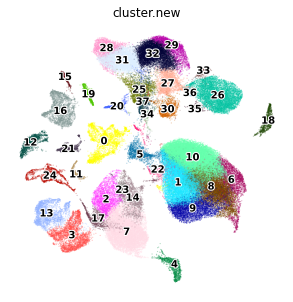

In [30]:
rcParams['figure.figsize'] = 5, 5
sc.pl.umap(scbat_obj_paga, color=['cluster.new'], legend_fontoutline=2,
           size = 6, legend_loc = 'on data', frameon = False, alpha = .3,
          save = 'figure_recluster/cluster_dimplot.pdf')


In [19]:
## find markers for each cluster
sc.tl.rank_genes_groups(scbat_obj_paga, 'cluster.new', method='wilcoxon')


In [6]:
## save 
# scbat_obj_paga.write('./scBAT_scanpy_noCold2_1_reprocess_paga_assign_cluster.h5ad')
scbat_obj_paga = sc.read_h5ad('./scBAT_scanpy_noCold2_1_reprocess_paga_assign_cluster.h5ad')


## cell annotation

In [3]:
## ==== prepare maker genes from PanglaoDB
pangodb = pd.read_csv('PanglaoDB_markers_27_Mar_2020.tsv', sep = '\t')
homology = pd.read_csv('human_mouse_homology_gene_pair.csv')
# ## to mouse
# marker_gene_mat = pd.merge(homology, marker_gene_mat, left_on = 'human_gene', right_index = True)
# marker_gene_mat.index = marker_gene_mat['mouse_gene'].tolist()
# marker_gene_mat = marker_gene_mat.drop(['mouse_gene', 'human_gene'], axis = 1)
marker_gene_mat = pangodb[(pangodb['species'].isin(['Mm', 'Mm Hs']))]
# ## only need some tissue and cell types
# tissue_need = ['Connective tissue', 'Vasculature', 'Immune system', 'Smooth muscle']
# celltype_need = ['Schwann cells', 'Neurons']
# marker_gene_mat = marker_gene_mat.loc[(marker_gene_mat['organ'].isin(tissue_need)) |
#                                       (marker_gene_mat['cell type'].isin(celltype_need)) ,:]
# ## remove very rare cell types that may cause misunderstanding in annotation
del_cells = ['Chondrocytes', 'Gamma delta T cells', 'Plasmacytoid dendritic cells', 'Red pulp macrophages',
            'Endothelial cells (aorta)', 'Myofibroblasts', 'Myoepithelial cells']
marker_gene_mat = marker_gene_mat[~marker_gene_mat['cell type'].isin(del_cells)]


In [4]:
## === select genes with high sensitivity (frequency of gene expressed in the cell type) and low specificity (frequency of gene expressed in not of the cells) score
scbat_obj_paga_genes = scbat_obj_paga.raw.to_adata().var.index.tolist()

marker_genes_dict = {}
for celltype in marker_gene_mat['cell type'].unique().tolist():
    tmp = marker_gene_mat[marker_gene_mat['cell type'] == celltype]
    tmp.index = tmp['official gene symbol'].tolist()
#     tmp = tmp['sensitivity_mouse']
#     tmp = tmp[['sensitivity_mouse', 'specificity_mouse']].T.mean().dropna().sort_values()
    ttmp = tmp[(tmp['sensitivity_mouse'] > 0.1) & (tmp['specificity_mouse'] < 0.4)].index.tolist()
#     ttmp = homology[homology['human_gene'].isin(tmp.index.tolist())]['mouse_gene'].tolist()
    ttmp = homology[homology['human_gene'].isin(ttmp)]['mouse_gene'].tolist()
    ttmp = list(set(ttmp) & set(scbat_obj_paga_genes))
    if ttmp:
        marker_genes_dict[celltype] = ttmp
    
## update marker genes manually
marker_genes_dict['Vascular smooth muscle cells'].extend(['Acta2', 'Pdgfrb', 'Cspg4'])
marker_genes_dict['ASCs'] = ['Cd34', 'Pdgfra', 'Ly6a', 'Itgb1']
marker_genes_dict['Preadipocytes'] = ['Cd34', 'Pdgfra', 'Ly6a', 'Pparg', 'Cebpa', 'Dcn']
marker_genes_dict['Adipocytes'].extend(['Retn', 'Cidec', 'Ucp1'])

## update Cd4 and Cd8 T cell
marker_genes_dict['CD8 T cells'] = marker_genes_dict['T cells'] + ['Cd8a', 'Cd8b1']
marker_genes_dict['CD4 T cells'] = marker_genes_dict['T cells'] + ['Cd4']
marker_genes_dict.pop('T cells')
### T reg
marker_genes_dict['T regulatory cells'].extend(['Foxp3', 'Il2ra'])

## correct: Nuocyte has been called as ILC2s since 2013, https://en.wikipedia.org/wiki/ILC2#cite_note-pmid24876829-9
## and add two additional markers
marker_genes_dict['ILC2s'] = marker_genes_dict['Nuocytes'] + ['Il5', 'Il13']
marker_genes_dict.pop('Nuocytes')

## remove cell type with only one gene as marker
marker_count = {x:len(marker_genes_dict[x]) for x in marker_genes_dict}
for cell in [x for x in marker_count if marker_count[x] < 5]:
    marker_genes_dict.pop(cell)
# remove T memory, since get same marker from T cells after checking, keep only T cell
marker_genes_dict.pop('T memory cells')
    

['Arhgap15',
 'Acp5',
 'Epsti1',
 'Lat',
 'Cd28',
 'Cd7',
 'Il7r',
 'Arhgap45',
 'Ptprc',
 'Cd247',
 'Ltb',
 'Cd4',
 'Gimap1',
 'Cd3e',
 'Lck',
 'Lef1',
 'Cd2',
 'Apbb1ip',
 'Cd27',
 'Itgb7',
 'Gimap4',
 'Dgka',
 'Arhgef1',
 'Cxcr6',
 'Cd3g',
 'Ptprcap',
 'Cd3d',
 'Cytip',
 'Nkg7',
 'Bin2',
 'Ikzf1',
 'Grap2',
 'Ccr7',
 'Bcl2',
 'Icos']

categories: 0, 1, 2, etc.
var_group_labels: Adipocytes, B cells, Basophils, etc.


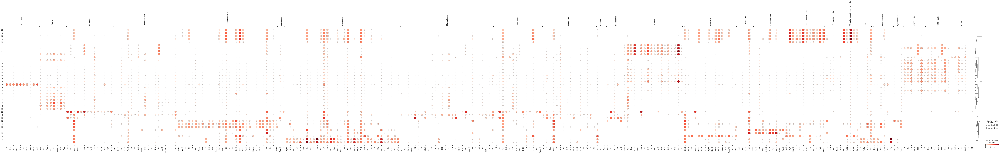

In [41]:
sc.pl.dotplot(scbat_obj_paga, marker_genes_dict, 'cluster.new', dendrogram=True,
              save = 'scBAT_scanpy_noCold2_1_reprocess_paga_subset_cell_marker_dot.pdf')


In [29]:
### 
## find markers for each cluster
sc.tl.rank_genes_groups(scbat_obj_paga, 'cluster.new', method='wilcoxon')
## extract diff score for all genes and make matrix
cluster_diff_score_mat = pd.DataFrame()
for c in scbat_obj_paga_update.obs['cluster.new'].unique().tolist():
    tmp = sc.get.rank_genes_groups_df(scbat_obj_paga, c)
    tmp.columns = c + '_' + tmp.columns
    tmp.index = tmp[c+'_names'].tolist()
    cluster_diff_score_mat = pd.concat([cluster_diff_score_mat, tmp[[c+'_scores']]], axis = 1)
cluster_diff_score_mat.columns = cluster_diff_score_mat.columns.str.replace('_scores', '')

## marker gene score 
cell_cluster_marker_score = {}
for cell_type in marker_genes_dict:
#     print(cell_type)
    genes = marker_genes_dict[cell_type]
    cell_cluster_marker_score[cell_type] = cluster_diff_score_mat.loc[genes].mean()
cell_cluster_marker_score = pd.DataFrame(cell_cluster_marker_score).T

df1 = cell_cluster_marker_score.copy()
df1.index = [x+' (n=%s)'%marker_count[x] for x in df1.index.tolist()]
df1.columns.name = 'Cluster'
## this is adipose tissue data, so remove Hepatic stellate cells (n=13) and Pancreatic stellate cells (n=15)
df1 = df1.drop(['Hepatic stellate cells (n=13)', 'Pancreatic stellate cells (n=15)'])

###
cluster_diff_score_mat.to_csv('cluster_diffexp_score.csv')
cell_cluster_marker_score.to_csv('cluster_cellmarker_score.csv')



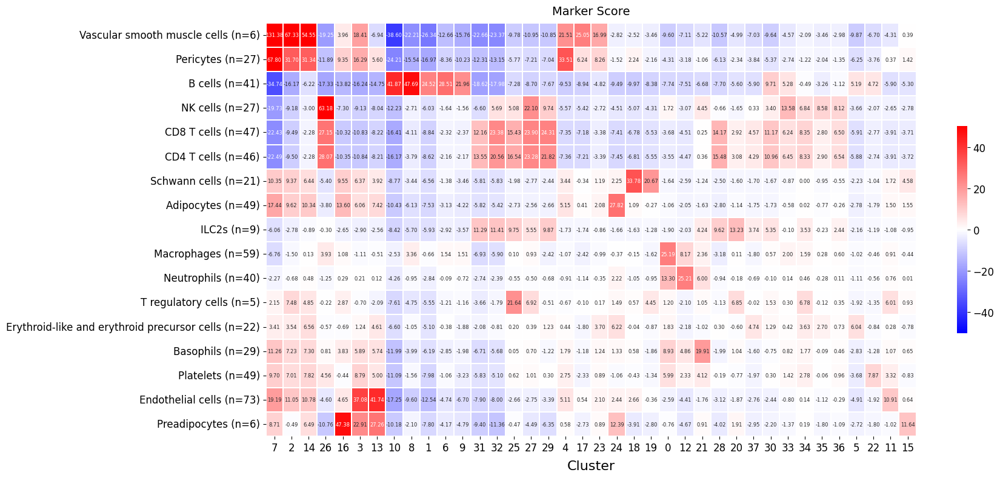

In [395]:
best_selected_celltype = df1.apply(lambda x: x.index[x==x.max()]).T[0].unique().tolist()
df1_new = df1.reindex(best_selected_celltype)

sp = sns.clustermap(df1_new,
            cmap = 'bwr', figsize = (16, 8), linewidth = .5, center = 0,
              vmax = 50, vmin = -50, annot = df1_new, fmt = '.2f',
              annot_kws={"size": 4})
plt.close()

col_order = [x.get_text() for x in sp.ax_heatmap.get_xticklabels()]
row_order = [x.get_text() for x in sp.ax_heatmap.get_yticklabels()]

df1_new = df1_new.reindex(index = row_order, columns = col_order)
fig, ax = plt.subplots(figsize = (18, 8))
sns.heatmap(data = df1_new,
           center = 0,vmax = 50, vmin = -50, annot = df1_new, fmt = '.2f',
              annot_kws={"size": 6}, cmap = 'bwr', cbar_kws = {'shrink':.5},
           linewidth = .1)
ax.set_title('Marker Score', fontsize = 14, pad = 10)
plt.tight_layout()
plt.savefig('scBAT_scanpy_noCold2_1_reprocess_paga_cell_marker_score_heatmap_v3_stat.pdf')
plt.show()
plt.close()



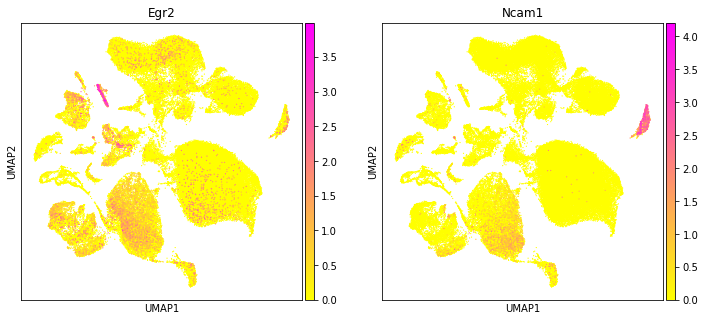

In [31]:
## Schwann cell clearly in two cluster in our data,
## Schwann cell can be Myelinating (Egr2) and Non-Myelinating (Ncam1)
## https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4393255/
## https://www.abcam.com/neuroscience/schwann-cell-markers-and-functions
## check expression for two markers
sc.pl.umap(scbat_obj_paga, color=['Egr2', 'Ncam1'], size = 6, color_map = 'spring_r',
          save = 'figure_recluster/Schwann_two_marker.pdf')
## so, cluster 19 will be Myelinating, and 18 will be Non-Myelinating


In [22]:
marker_genes_dict['MSC'] = ['Egr2']
marker_genes_dict['NMSC'] = ['Ncam1']
marker_genes_dict['Cytotoxic_T'] = ['Nkg7', 'Gzma', 'Gzmb', 'Ifng']
marker_genes_dict['Lymph_EC'] = ['Lyve1']
marker_genes_dict['Pdgfra_APC'] = ['Pdgfra', 'Ly6a', 'Cd34', 'Dcn']


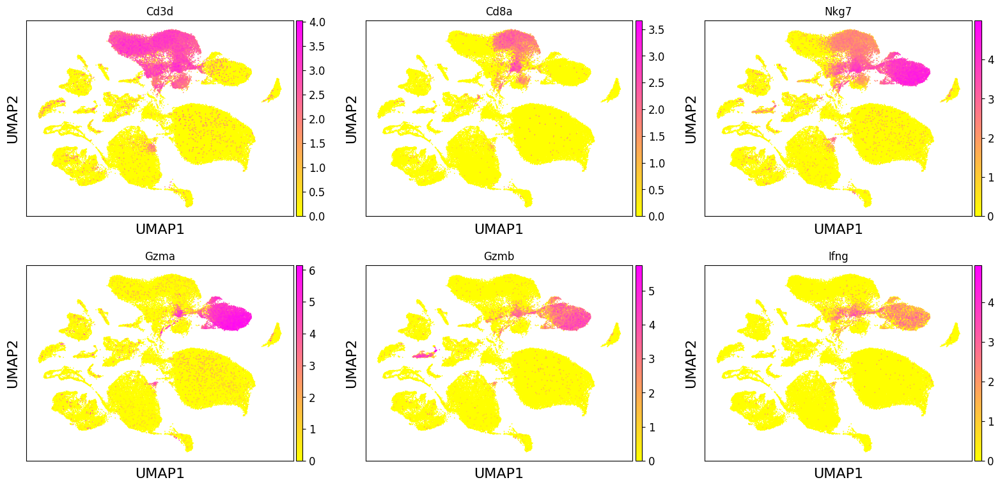

In [3]:
## check cytotoxic markers Gzma, Gzmb, Ifng
sc.pl.umap(scbat_obj_paga, color=['Cd3d', 'Cd8a', 'Nkg7', 'Gzma', 'Gzmb', 'Ifng'],
           size = 6, color_map = 'spring_r', ncols = 3,
           save = 'figure_recluster/cytotoxic_markers.pdf')


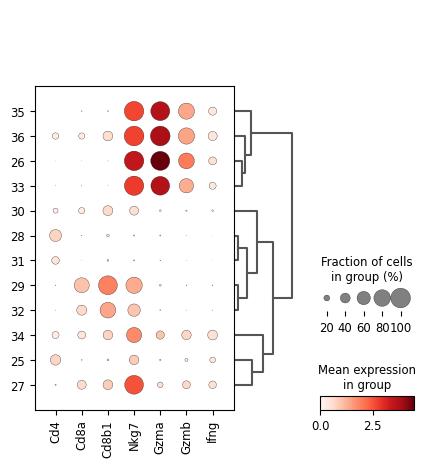

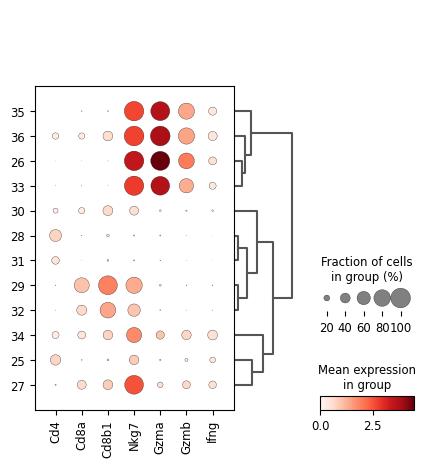

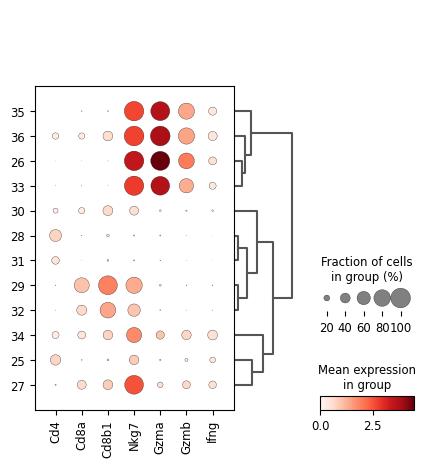

In [6]:
nclusters = ['28', '31', '32', '29', '27', '25', '30', '34', '35', '36', '33', '26']
ncluster_obj = scbat_obj_paga[scbat_obj_paga.obs['cluster.new'].isin(nclusters)]
sc.tl.dendrogram(ncluster_obj, groupby = 'cluster.new')
sc.pl.dotplot(ncluster_obj, ['Cd4', 'Cd8a', 'Cd8b1', 'Nkg7', 'Gzma', 'Gzmb', 'Ifng'], 'cluster.new',
             dendrogram=True, save = 'cytotoxic_marker_dotplot.pdf')
## so, cluster 34 and 27 would be the cytotoxic T cells             


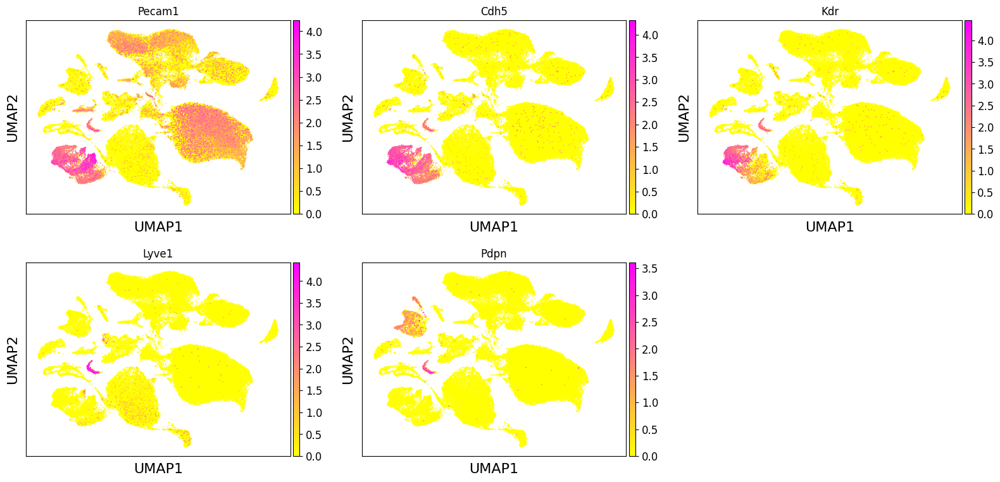

In [19]:
## lymphomatic EC
# marker_genes_dict['Lymphatic_EC'] = ['Lyve1', 'Pdpn', 'Pecam1'] #https://www.pnas.org/content/99/25/16069
sc.pl.umap(scbat_obj_paga, color=['Pecam1', 'Cdh5', 'Kdr', 'Lyve1', 'Pdpn'],
           size = 6, color_map = 'spring_r', ncols = 3,
          save = 'figure_recluster/LyphomaticEC_markers.pdf')

##so, cluster 11 will be Lymphatic EC


In [32]:
# df.apply(lambda col: ' | '.join([x.split(' (')[0] for x in col.sort_values(ascending = False).index.tolist()[:2]]))
## assign each cluster a cell type with highest marker score
custer_cellann = df1.apply(lambda col: col.sort_values(ascending = False).index.tolist()[0].split(' (')[0])
# ## revise Schwann cell Myelinating (Egr2) and Non-Myelinating (Ncam1)
custer_cellann['19'] = 'MSC' #'Myelinating Schwann cells'
custer_cellann['18'] = 'NMSC' #'Non-myelinating Schwann cells'
# # ## revise cluster 25 as Treg, as Foxp3
# custer_cellann['25'] = 'Treg'
# ## revise cluster 15 and 16 original name preadipocyte as Pdgfra_APC since high pdgfra
custer_cellann['15'] = 'Pdgfra_APC'
custer_cellann['16'] = 'Pdgfra_APC'
## cytotoxic T cells
custer_cellann['27'] = 'Cytotoxic_T'
custer_cellann['34'] = 'Cytotoxic_T'
## Lymphotic EC
custer_cellann['11'] = 'Lymph_EC'

#### re-name
rename_dict = {'T regulatory cells':'Treg', 'Vascular smooth muscle cells':'VSM',
              'Endothelial cells': 'EC', 'CD8 T cells':'CD8T', 'CD4 T cells':'CD4T',
              'Erythroid-like and erythroid precursor cells':'Erythroid-like', 
              'B cells':'Bcells'}
custer_cellann_new = {i: rename_dict[custer_cellann[i]] if custer_cellann[i] in rename_dict else custer_cellann[i].replace(' cells', '') for i in custer_cellann.keys()}
# ## cluster 30 expressed high Cd8b1 and close to T cells rather than B cells
# custer_cellann['30'] = 'CD8 T cells'

scbat_obj_paga.obs['cell_type'] = scbat_obj_paga.obs['cluster.new'].apply(lambda x: custer_cellann_new.get(x))


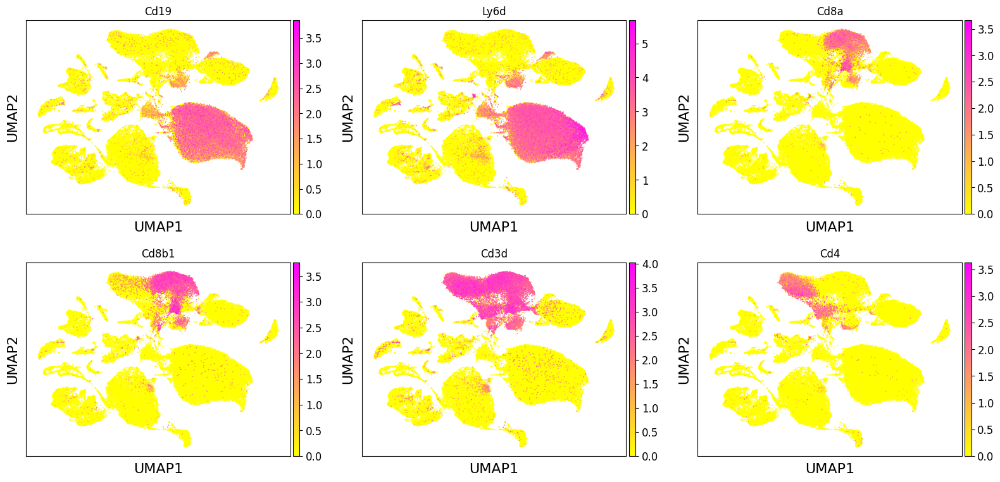

In [48]:
## the cluster 30 is a strong population, since it expressed both T cell and B cell markers
sc.pl.umap(scbat_obj_paga, color=['Cd19', 'Ly6d', 'Cd8a', 'Cd8b1', 'Cd3d', 'Cd4'],
           size = 6, color_map = 'spring_r', ncols = 3,
          save = 'figure_recluster/T_B_cell_markers_cluster30.pdf')
## so, could be doublet and consider to discard them


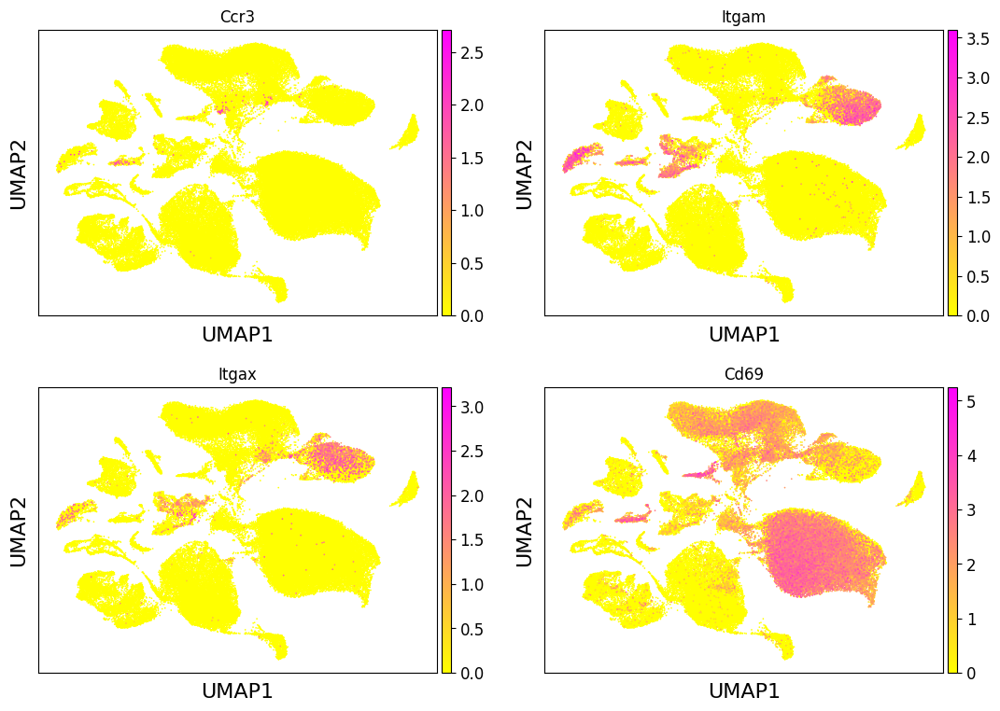

In [91]:
### debating between Basophils and Eosinophils for cluster21
## common marker Ccr3
## Eosinophils specific: Itgam
## Basophils specific: Cd69 and depeletion of Itgax
sc.pl.umap(scbat_obj_paga, color=['Ccr3', 'Itgam', 'Itgax', 'Cd69'],
           size = 6, color_map = 'spring_r', ncols = 2, 
           save = 'figure_recluster/Basophils_Eosinophils_markers_cluster21.pdf')


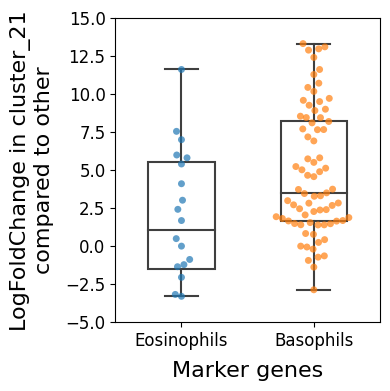

In [92]:
### debating between Basophils and Eosinophils for cluster21
cluster21_diff = sc.get.rank_genes_groups_df(scbat_obj_paga, '21')
cluster21_diff.index = cluster21_diff['names'].tolist()

## debating Basophils and Eosinophils
egene = marker_gene_mat[marker_gene_mat['cell type'] == 'Eosinophils']['official gene symbol']
bgene = marker_gene_mat[marker_gene_mat['cell type'] == 'Basophils']['official gene symbol']
egene_dat = cluster21_diff.loc[cluster21_diff.index.str.upper().isin(egene),'logfoldchanges'].tolist()
bgene_dat = cluster21_diff.loc[cluster21_diff.index.str.upper().isin(bgene),'logfoldchanges'].tolist()

plot_df = pd.DataFrame([egene_dat+bgene_dat, 
                        ['Eosinophils']*len(egene_dat)+['Basophils']*len(bgene_dat)]).T
plot_df.columns = ['LogFoldChange', 'Cell']
fig, ax = plt.subplots(figsize = (4,4))
sns.boxplot(data = plot_df, x = 'Cell', y = 'LogFoldChange', showfliers = False,
           boxprops = {'facecolor':'none'}, width = .5)
sns.swarmplot(data = plot_df, x = 'Cell', y = 'LogFoldChange', alpha = .7)
plt.ylim(-5, 15)
ax.set_ylabel('LogFoldChange in cluster_21\ncompared to other')
ax.set_xlabel('Marker genes')

plt.tight_layout()
fig.savefig('Basophils_Eosinophils_markers_cluster21_boxplot.pdf')
plt.show()


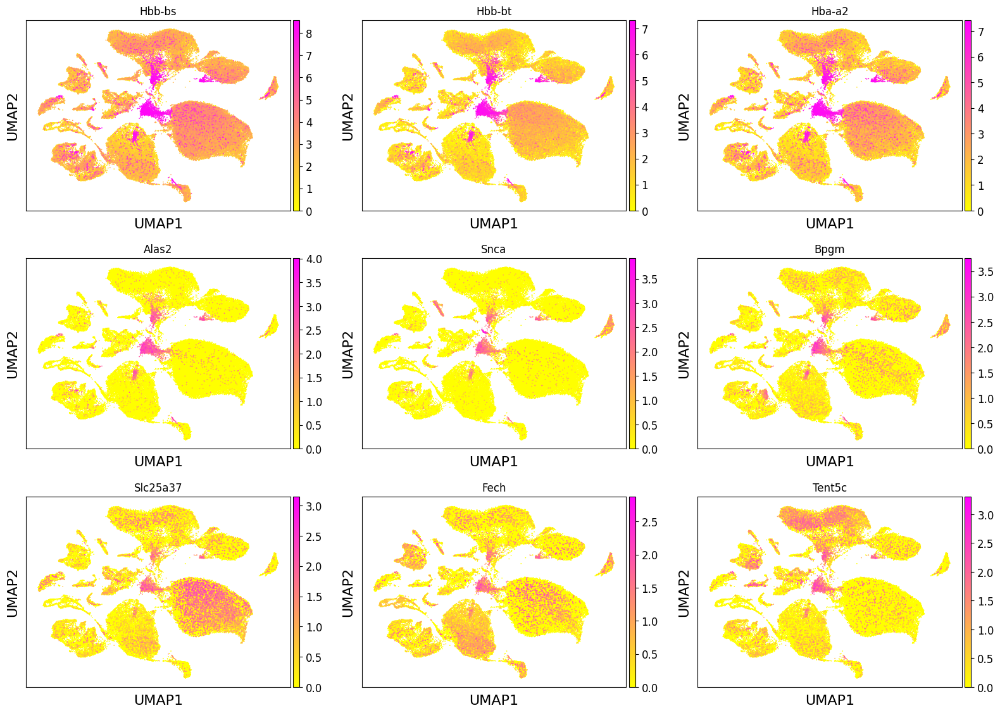

In [397]:
### top specific genes in cluster 5 and 37 which considered as Erythroid-like cells
sc.pl.umap(scbat_obj_paga, color=['Hbb-bs', 'Hbb-bt', 'Hba-a2', 'Alas2', 'Snca', 'Bpgm', 'Slc25a37', 'Fech', 'Tent5c'], size = 6,
           color_map = 'spring_r', ncols = 3, save = 'figure_recluster/Erythroid_markers.pdf')


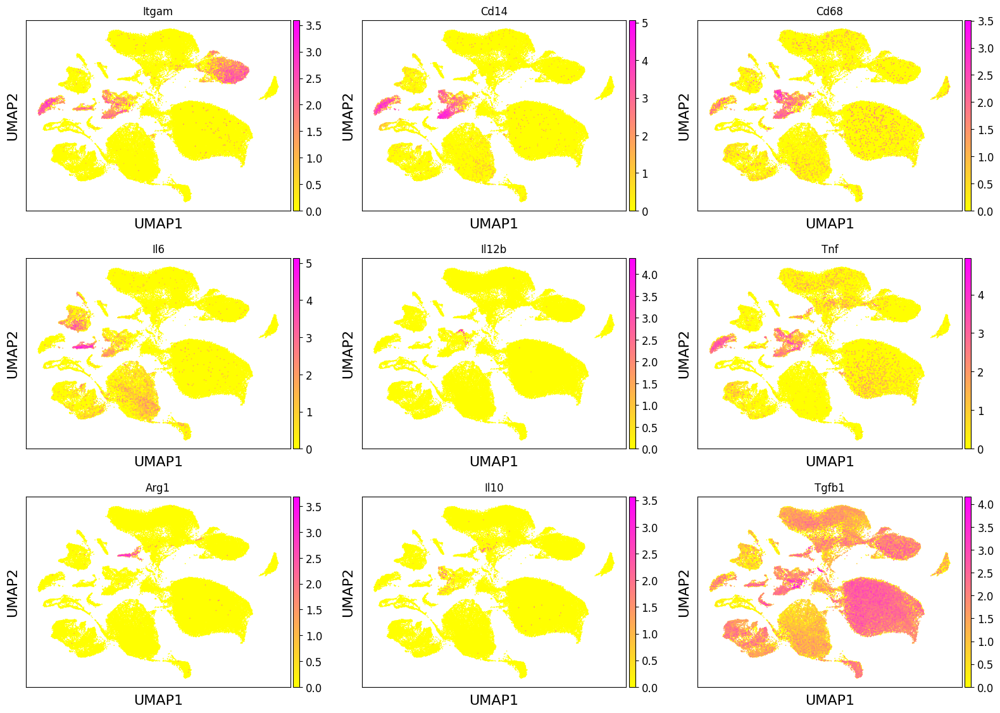

In [10]:
## M1 and M2
sc.pl.umap(scbat_obj_paga, color=['Itgam', 'Cd14', 'Cd68', 
                                         'Il6', 'Il12b', 'Tnf', 
                                         'Arg1', 'Il10', 'Tgfb1'], size = 6,
           color_map = 'spring_r', ncols = 3, save = 'figure_recluster/Macro_M1_m2_markers.pdf')
## no obvious M1 and M2 found, so keep using macrophage


In [2]:
## discard cluster 30
# scbat_obj_paga_update = scbat_obj_paga[~scbat_obj_paga.obs['cluster.new'].isin(['30'])]

# scbat_obj_paga_update.write('./scBAT_scanpy_noCold2_1_reprocess_paga_assign_cluster_celltype_updated.h5ad')
# scbat_obj_paga_update = sc.read_h5ad('./scBAT_scanpy_noCold2_1_reprocess_paga_assign_cluster_celltype_updated.h5ad')

scbat_obj_paga_update = sc.read_h5ad('/Users/rongbinzheng/Documents/BCH/ChenLab/Metabolism/mebocost_test/scBAT_scanpy_noCold2_1_reprocess_paga_assign_cluster_celltype_updated.h5ad')


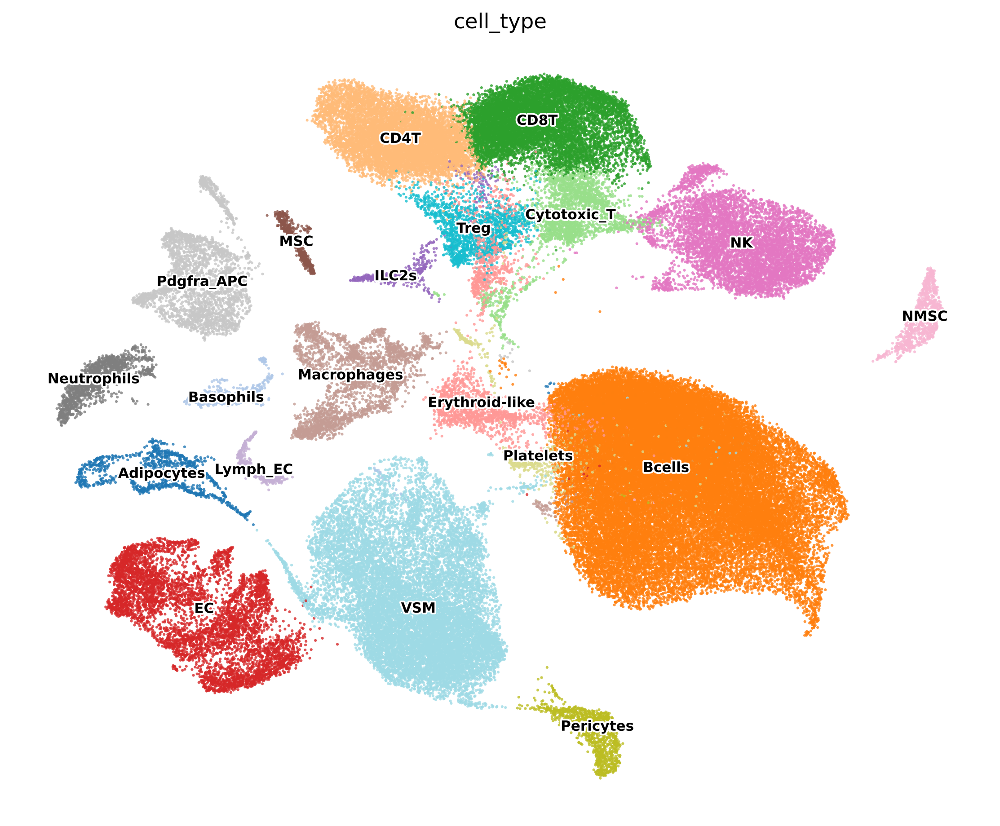

In [74]:
rcParams['figure.figsize'] = 10,8
# plt.rcParams['figure.dpi'] = 180

sc.pl.umap(scbat_obj_paga_update, color=['cell_type'], size = 10, frameon = False, alpha = .8,
           legend_fontoutline=2, legend_loc = 'on data', legend_fontsize = 8, palette = 'tab20',
           save = 'figure_recluster/scBAT_scanpy_noCold2_1_reprocess_cell_ann_updated.pdf')


/root/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type_label' as categorical


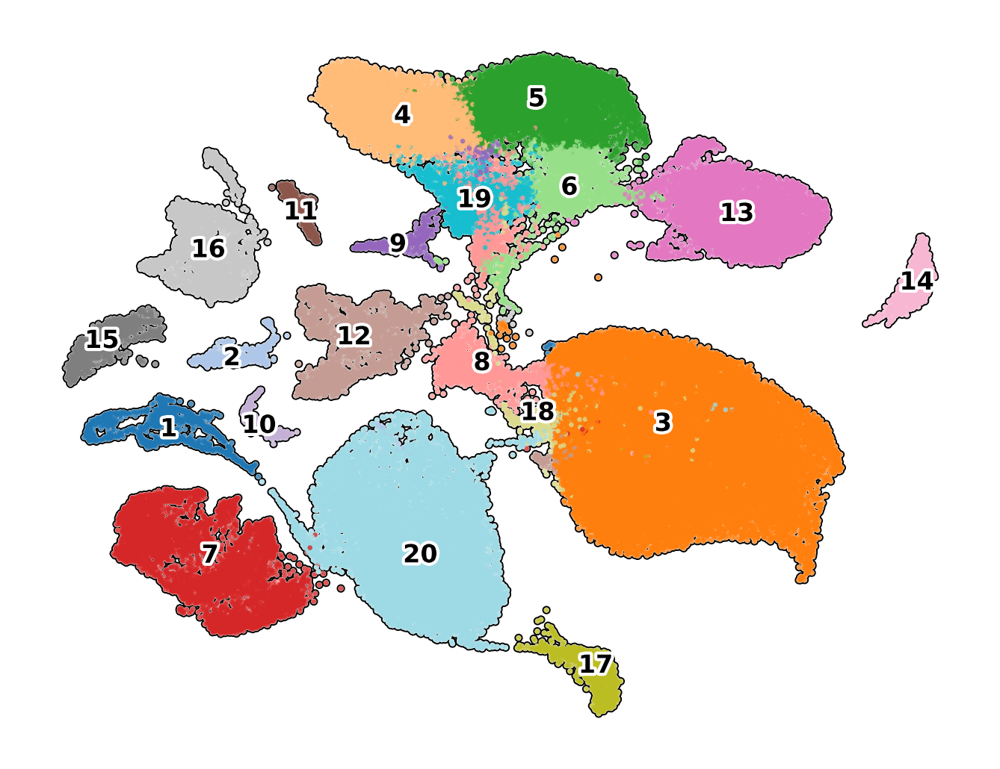

In [33]:
celltypes = scbat_obj_paga_update.obs['cell_type'].unique().sort_values().tolist()
celltype_numlabel = {celltypes[i]:i+1 for i in range(len(celltypes))}
scbat_obj_paga_update.obs['cell_type_label'] = [str(celltype_numlabel.get(x)) for x in scbat_obj_paga_update.obs['cell_type'].tolist()]

sc.pl.umap(scbat_obj_paga_update, color=['cell_type_label'], size = 10, frameon = False, alpha = .8,
           legend_fontoutline=2, legend_loc = 'on data', legend_fontsize = 8, palette = 'tab20', title = '',
          add_outline = True, save = 'scBAT_scanpy_noCold2_1_reprocess_cell_ann_updated.pdf')
           

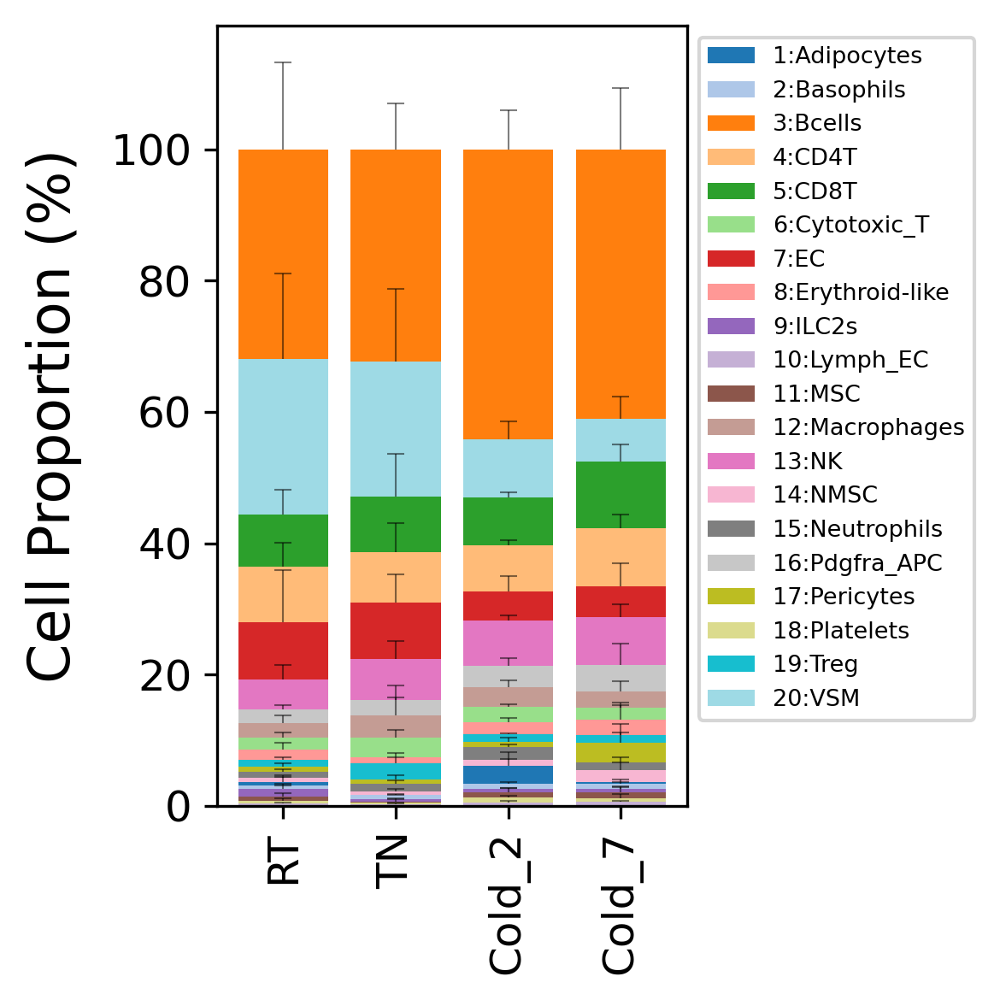

In [43]:
## cell proportion in conditions and samples
cell_type_count_cond = scbat_obj_paga_update.obs.groupby(['sample_name', 'cell_type'], group_keys=False)['cell_type_cluster'].count()
cell_type_perct_cond = cell_type_count_cond.groupby('sample_name', group_keys=False).apply(lambda df: (df*100)/df.sum()).reset_index()
cell_type_perct_cond.columns = ['sample_name', 'Celltype', 'percentage']
cell_type_perct_cond['Condition'] = [x.split('_')[0] for x in cell_type_perct_cond['sample_name'].tolist()]

# Data
groups = ['RT', 'TN', 'Cold_2', 'Cold_7']#cell_type_perct_cond['Condition'].unique().tolist()

values = pd.Series([0,0,0,0], index = ['RT', 'TN', 'cold2', 'cold7'])
celltypes = cell_type_perct_cond.groupby('Celltype')['percentage'].mean().sort_values().index.tolist()


fig, ax = plt.subplots(figsize = (4, 4))
# Stacked bar chart
for celltype in celltypes:
    v = cell_type_perct_cond[cell_type_perct_cond['Celltype'] == celltype].groupby('Condition')['percentage'].mean()
    v_std = cell_type_perct_cond[cell_type_perct_cond['Celltype'] == celltype].groupby('Condition')['percentage'].std()
    ax.bar(groups, v.tolist(), edgecolor = "none", 
           linewidth = .5, color = colmap[celltype], bottom = values,
           alpha = 1, label = str(celltype_numlabel.get(celltype))+':'+celltype)
    plotline2, caplines2, barlinecols2 = ax.errorbar(groups, (values+v).tolist(), yerr=v_std,
                       lolims=True, capsize = 0, ls='None', color='k', linewidth = .5, alpha = .5)
    caplines2[0].set_marker('_')
    caplines2[0].set_markersize(5)
    caplines2[0].set_markeredgewidth(.5)
    values = values + v
handles, labels = plt.gca().get_legend_handles_labels()

order_celltype = ['1:Adipocytes', '2:Basophils', '3:Bcells',
       '4:CD4T', '5:CD8T', '6:Cytotoxic_T', '7:EC', '8:Erythroid-like',
       '9:ILC2s', '10:Lymph_EC', '11:MSC', '12:Macrophages', '13:NK', '14:NMSC',
       '15:Neutrophils', '16:Pdgfra_APC', '17:Pericytes', '18:Platelets',
       '19:Treg', '20:VSM']
order = [labels.index(x) for x in order_celltype]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order],
          bbox_to_anchor=(1, 1), loc='upper left', fontsize = 6.5) 

ax.set_ylabel('Cell Proportion (%)')
ax.tick_params(axis = 'x', rotation = 90)
plt.tight_layout()
fig.savefig('cell_proportion_updated_cond_mean_errbar.pdf')
plt.show()
plt.close()


In [72]:
## plot marker genes for clusters
rename_dict = {'T regulatory cells':'Treg', 'Vascular smooth muscle cells':'VSM',
              'Endothelial cells': 'EC', 'CD8 T cells':'CD8T', 'CD4 T cells':'CD4T',
              'Erythroid-like and erythroid precursor cells':'Erythroid-like', 
              'B cells':'Bcells', 'NK cells': 'NK'}
marker_genes_dict = {rename_dict[x]
                     if x in rename_dict.keys() else x: marker_genes_dict[x] for x in marker_genes_dict}

cluster_diff_score_mat = pd.read_csv('./cluster_diffexp_score.csv', index_col = 0)
cell_type_gene = {}
for c in scbat_obj_paga_update.obs['cell_type'].unique().tolist():
    cc = scbat_obj_paga_update.obs[scbat_obj_paga_update.obs['cell_type'] == c]['cluster.new'].unique().tolist()
    cc = list(set(cc) - set(['30']))
    genes = cluster_diff_score_mat[cc].T.mean().sort_values(ascending = False).head(50).index.tolist()
    if c in marker_genes_dict:
        cell_type_gene[c] = np.intersect1d(genes, marker_genes_dict[c]).tolist()
#     elif c in EC_markers:
#         cell_type_gene[c] = np.intersect1d(genes, EC_markers[c]).tolist()
    else:
        cell_type_gene[c] = []#genes[:5]
## adjust 
cell_type_gene['Treg'] = cell_type_gene['Treg']+['Foxp3']
cell_type_gene['Adipocytes'] = cell_type_gene['Adipocytes']+['Ucp1']
cell_type_gene['CD4T'] = cell_type_gene['CD4T']+['Cd4']
cell_type_gene['CD8T'] = cell_type_gene['CD4T']+['Cd8a']

cc = scbat_obj_paga_update.obs[scbat_obj_paga_update.obs['cell_type'] == 'NMSC']['cluster.new'].unique().tolist()
cc = list(set(cc) - set(['30']))
gene1 = cluster_diff_score_mat[cc].T.mean().sort_values(ascending = False).head(50).index.tolist()
cc = scbat_obj_paga_update.obs[scbat_obj_paga_update.obs['cell_type'] == 'MSC']['cluster.new'].unique().tolist()
cc = list(set(cc) - set(['30']))
gene2 = cluster_diff_score_mat[cc].T.mean().sort_values(ascending = False).head(50).index.tolist()
genes = gene1+gene2
cell_type_gene['Schwann cells'] = list(np.intersect1d(marker_genes_dict['Schwann cells'], genes))

cell_type_gene['MSC'] = ['Egr2']


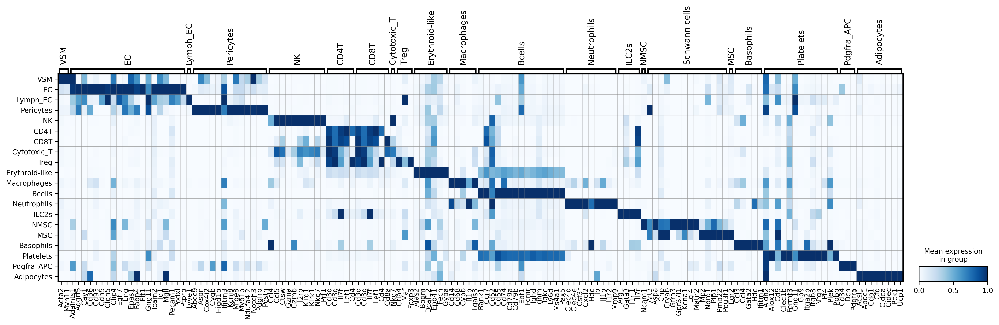

In [75]:

orders = [ 'VSM',  'EC', 'Lymph_EC', 'Pericytes', 'NK',
          'CD4T', 'CD8T', 'Cytotoxic_T', 'Treg', 
          'Erythroid-like', 'Macrophages', 'Bcells',
           'Neutrophils',  'ILC2s', 'NMSC', 'Schwann cells', 'MSC',
          'Basophils', 'Platelets', 'Pdgfra_APC', 'Adipocytes']

scbat_obj_paga_update.obs['cell_type'] = pd.Categorical(
    scbat_obj_paga_update.obs['cell_type'].tolist(),
    categories=[x for x in orders if x != 'Schwann cells'])

sc.pl.matrixplot(scbat_obj_paga_update, 
              {x:cell_type_gene[x] for x in orders},
              groupby='cell_type',
              standard_scale = 'var',
              cmap='Blues',
              figsize = (20, 4.5),
              save = 'dotplot_marker.pdf'
             )



Trying to set attribute `.uns` of view, copying.


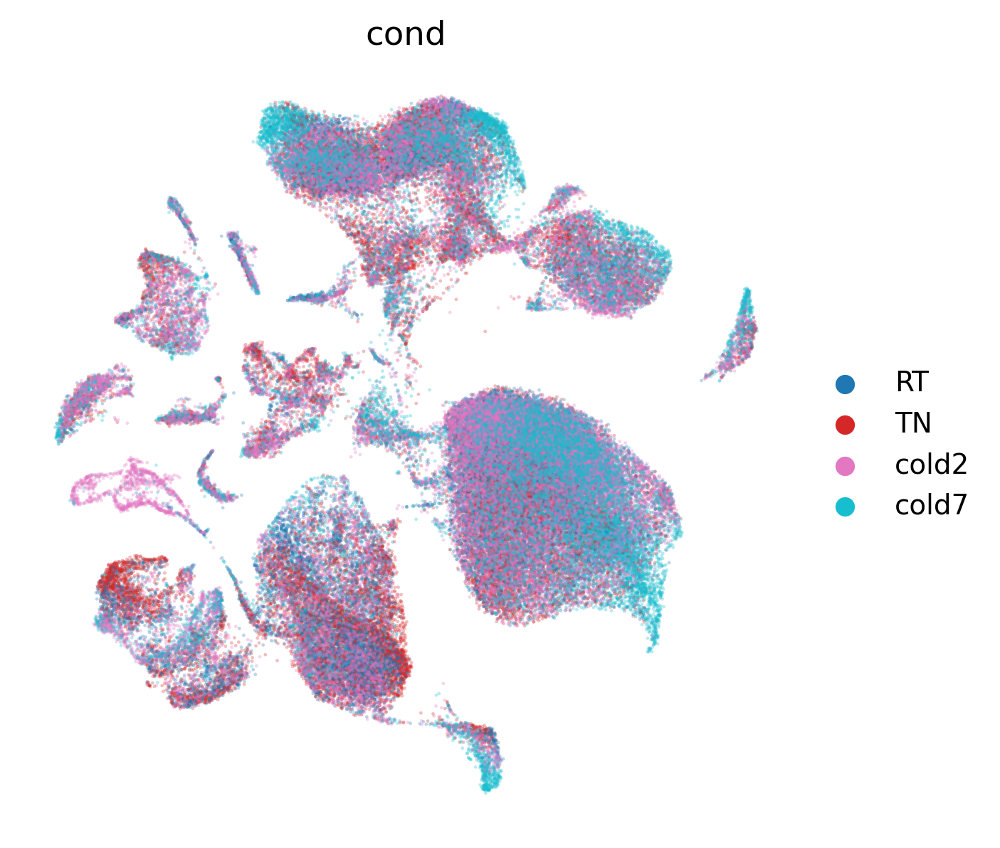

In [50]:
rcParams['figure.figsize'] = 5,5
plt.rcParams['figure.dpi'] = 280
sc.pl.umap(scbat_obj_paga_update, color=['cond'], size = 6, alpha = .3, 
           frameon = False, legend_fontsize = 10, palette = 'tab10',
           save = 'figure_recluster/scBAT_scanpy_noCold2_1_reprocess_cond_updated.pdf')


In [54]:
## output expression matrix and annotation by condition, for performing CellChat

for cond in scbat_obj_paga.obs['cond'].unique().tolist():
    tmp = scbat_obj_paga.raw.to_adata()[scbat_obj_paga.raw.to_adata().obs['cond']==cond]
    ## exp
    pd.DataFrame(tmp.X.toarray(), index=tmp.obs_names, columns=tmp.var_names).to_csv('./scanpy_exp/{}_sc_exp.csv'.format(cond),
                                                                                    compression = 'gzip', sep = '\t')
    ## ann
    tmp.obs.to_csv('./scanpy_exp/{}_sc_meta.csv'.format(cond), sep = '\t')
    
    

In [24]:
## cell proportion in conditions
cell_type_count_cond = scbat_obj_paga_update.obs.groupby(['cond', 'cell_type'])['cell_type_cluster'].count()
cell_type_perct_cond = cell_type_count_cond.groupby('cond').apply(lambda df: (df*100)/df.sum()).reset_index()
cell_type_perct_cond.columns = ['Condition', 'Celltype', 'Proportion']


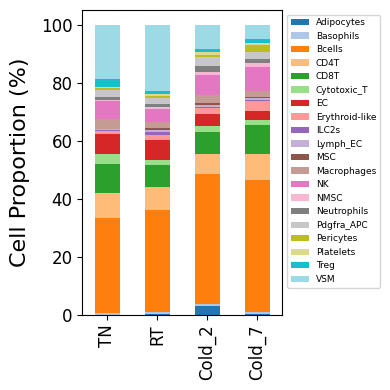

In [43]:

## 
fig, ax = plt.subplots(figsize = (4, 4))
plot_df = cell_type_perct_cond.pivot_table(index = 'Condition', columns = 'Celltype')
plot_df.index.name = None
plot_df.columns.name = None
plot_df.columns = plot_df.columns.get_level_values(1).tolist()
plot_df = plot_df.reindex(index = ['TN', 'RT', 'cold2', 'cold7'])
plot_df.index = ['TN', 'RT', 'Cold_2', 'Cold_7']

plot_df.plot(kind = 'bar', stacked = True, ax = ax, color = colmap)
ax.set_ylabel('Cell Proportion (%)')
ax.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize = 6.5)
# sns.despine(trim = True, offset = 10)
plt.tight_layout()
fig.savefig('cell_proportion_updated.pdf')
plt.show()
plt.close()


In [52]:
## ===== cell proportion in each sample of each condition =====

meta = scbat_obj_paga_update.obs.copy()
df = meta.groupby(['cond', 'cell_type', 'sample_name'])['gsm'].count().groupby('sample_name').apply(lambda x: x*100/sum(x)).reset_index()
df.columns = ['cond', 'cell_type', 'sample_name', 'proportion']
df['label'] = df.apply(lambda row: row['cond'] == row['sample_name'].split('_')[0], axis = 1)
df = df[df['label'] == True].drop(['label'], axis = 1)

# for cond in ['TN', 'RT', 'cold2', 'cold7']:
#     for cell in meta['cell_type'].unique().tolist():
#         tmp = meta[(meta['cell_type'] == cell) & (meta['cond'] == cond)]
#         tmp = pd.Series(collections.Counter(tmp['sample_name']))
#         tmp = pd.DataFrame([[cond]*len(tmp), [cell]*len(tmp), tmp.tolist(), tmp.index.tolist()],
#             index = ['cond', 'cell_type', 'count', 'sample']).T
#         df = pd.concat([df, tmp])
        
# df['proportion'] = df.groupby('sample')['count'].apply(lambda x: x*100/sum(x)).tolist()



def wald_test(Y, X):

    df = pd.DataFrame()
    df['coeff'] = X.columns
    df['chi-square statisitic'] = None
    df['p-value'] = None
    
    n = X.shape[0]
    g = np.linalg.solve(np.dot(X.T, X), np.eye(X.shape[1])).dot(X.T).dot(Y)
    Y_hat = np.dot(X, g)
    sigma_squared = (1/(n-X.shape[1]))*((Y-Y_hat)**2).sum().values[0]
    g_variance = sigma_squared * np.linalg.solve(np.dot(X.T, X), np.eye(X.shape[1]))
    
    
    for i in range(0, X.shape[1]):
        J_g_null = np.zeros(X.shape[1]).reshape(1, X.shape[1])
        J_g_null[0, i] = 1
        
        denom_term = np.dot(J_g_null, g_variance).dot(J_g_null.T)
        denom_term = np.linalg.solve(denom_term, np.eye(denom_term.shape[1]))
        
        W = g[i, 0] * denom_term * g[i, 0]
        df.loc[i, 'chi-square statisitic'] = W[0,0]
        df.loc[i, 'p-value'] = stats.chi2.sf(W[0,0] , 1)
        
        del J_g_null, denom_term, W
            
    return(df)

## testing by wald-test
cell_prop_test = pd.DataFrame()
for cell in df['cell_type'].unique().tolist():
    Y = df[df['cell_type'] == cell][['proportion']]
    X = pd.get_dummies(df[df['cell_type'] == cell]['cond']).drop(['TN'], axis = 1)
    X = pd.concat([X, pd.DataFrame([1]*X.shape[0], columns = ['Intercept'], index = X.index)], axis = 1)
    res = wald_test(Y, X)
    res = res[res['coeff'] != 'Intercept']
    res['cell'] = cell
    cell_prop_test = pd.concat([cell_prop_test, res])
cell_prop_test['fdr'] = sm.stats.multipletests(cell_prop_test['p-value'], method="fdr_bh")[1]
cell_prop_test['avg_prop'] = [df[(df['cond'] == x[0]) & (df['cell_type'] == x[1])]['proportion'].median() for x in cell_prop_test[['coeff', 'cell']].values.tolist()]

fdr_p005 = sm.stats.multipletests(cell_prop_test['p-value'].tolist()+[0.05], method="fdr_bh")[1][-1]
sing_changed_cell = cell_prop_test[cell_prop_test['fdr'] <= fdr_p005]

### plot
pdf = PdfPages('cell_proportion_boxplot.pdf')
for cell_type in cell_prop_test['cell'].unique().tolist():
    fig, ax = plt.subplots(figsize = (3.5,4))
    sns.boxplot(data = df[df['cell_type'] == cell_type],
                x = 'cond', y = 'proportion', color = colmap[cell_type],
                showfliers = False, width = .5 ,
                order = ['TN', 'RT', 'cold2', 'cold7']
               )
    sns.swarmplot(data = df[df['cell_type'] == cell_type],
                 x = 'cond', y = 'proportion', alpha = .7,
                  order = ['TN', 'RT', 'cold2', 'cold7'],
                 color = 'grey')
    plt.xticks(range(4), ['TN', 'RT', 'Cold_2', 'Cold_7'])
    ax.set_xlabel('')
    ax.set_ylabel('Cell proportion (%)')
    sns.despine(trim = True, offset = 2)
    p = cell_prop_test[cell_prop_test['cell'] == cell_type]['p-value'].min()
    ax.set_title('%s\nWald test p = %.4f'%(cell_type, p))
    ax.tick_params(axis = 'x', rotation = 45)
    plt.tight_layout()
    pdf.savefig(fig)
#     plt.close()
#     plt.show()
    plt.close()
#     break
pdf.close()


/tmp/ipykernel_1471/2493273234.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = meta.groupby(['cond', 'cell_type', 'sample_name'])['gsm'].count().groupby('sample_name').apply(lambda x: x*100/sum(x)).reset_index()


## pairwise diff exp between cond


In [4]:

compare = [['RT', 'TN'],
          ['cold2', 'TN'],
          ['cold7', 'TN'],
          ['cold2', 'RT'],
          ['cold7', 'RT'],
          ['cold7', 'cold2']]

def _run_(obj, prefix):
    pairwise_diff = collections.defaultdict()
    compare = [['RT', 'TN'],
              ['cold2', 'TN'],
              ['cold7', 'TN'],
              ['cold2', 'RT'],
              ['cold7', 'RT'],
              ['cold7', 'cold2']]

    for i,j in compare:
        print(i, j)
        diff_cond = sc.tl.rank_genes_groups(obj, groupby = 'cond', groups = [i], reference=j,
                                                   method='wilcoxon', copy = True, use_raw = True)
        diff_cond_mat = sc.get.rank_genes_groups_df(diff_cond, i)
        pairwise_diff[i+'~vs~'+j] = diff_cond_mat
        
    ## save
    out = open('diffexp/'+prefix+'pairwise_diff_allcells.pk', 'wb')
    pk.dump(pairwise_diff, out)
    out.close()
    
if not os.path.exists('diffexp'):
    os.mkdir('diffexp')
## excutive
#_run_(scbat_obj_paga_update, 'allcell')
for cell in scbat_obj_paga_update.obs['cell_type'].unique():
    print('++++++++++ '+ cell)
    try:
        obj_new = scbat_obj_paga_update[scbat_obj_paga_update.obs['cell_type']==cell]
        _run_(obj_new, cell)
    except:
        print('Problem: '+cell)



## ligand receptor genes


In [2]:
## cellchat db
cellchat_db = pd.read_csv('cellchatDB_mouse.csv', index_col = 0, sep = '\t')
## ligand gene list
ligand_secreted = cellchat_db[cellchat_db['annotation'] == 'Secreted Signaling']['interaction_name_2'].apply(lambda x: x.split(' - ')[0].strip()).unique().tolist()
ligand_ECM = cellchat_db[cellchat_db['annotation'] == 'ECM-Receptor']['interaction_name_2'].apply(lambda x: x.split(' - ')[0].strip()).unique().tolist()
ligand_CC = cellchat_db[cellchat_db['annotation'] == 'Cell-Cell Contact']['interaction_name_2'].apply(lambda x: x.split(' - ')[0].strip()).unique().tolist()
## receptor
def _get_gene_(df):
    genes = []
    for x in df['interaction_name_2'].tolist():
        genes.extend(x.split(' - ')[1].rstrip(')').lstrip('(').split('+'))
    return(genes)
    
receptor_for_secreted = list(set(_get_gene_(cellchat_db[cellchat_db['annotation'] == 'Secreted Signaling'])))
receptor_for_ECM = list(set(_get_gene_(cellchat_db[cellchat_db['annotation'] == 'ECM-Receptor'])))
receptor_for_CC = list(set(_get_gene_(cellchat_db[cellchat_db['annotation'] == 'Cell-Cell Contact'])))

## all ligand and receptor
lr_all_gene = list(set(ligand_secreted+ligand_ECM+ligand_CC+receptor_for_secreted+receptor_for_ECM+receptor_for_CC))


## ligand-receptor diff for cell types


In [7]:
## all diff exp for cell type
## collect diff exp gene for each cell type between any two conditons
path = './diffexp/'
celltypes = {x.replace('pairwise_diff_allcells.pk', ''):os.path.join(path, x) for x in os.listdir(path) if x.endswith('pairwise_diff_allcells.pk') and not x.startswith('allcell')}

diffexp_lr_all = pd.DataFrame()
for ct in celltypes.keys():
    tmp = pk.load(open(celltypes[ct], 'rb'))
    for x in tmp.keys():
        ttmp = tmp[x].loc[tmp[x]['names'].isin(lr_all_gene),]
        ttmp['compare'] = x
        ttmp['cell_type'] = ct
        diffexp_lr_all = pd.concat([diffexp_lr_all, ttmp])
        
## output file
with pd.ExcelWriter('diffexp_scBAT_condpair_celltype.xlsx') as writer:
    for cell in diffexp_lr_all['cell_type'].unique().tolist():
        tmp = diffexp_lr_all[diffexp_lr_all['cell_type'] == cell].sort_values('names')
        tmp.to_excel(writer, sheet_name=cell, index = False)
        del tmp
    diffexp_lr_all.to_excel(writer, sheet_name='all sheet combined', index = False)
    
    


<ipython-input-7-d4c68c402ef4>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ttmp['compare'] = x
<ipython-input-7-d4c68c402ef4>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ttmp['cell_type'] = ct
